#Libraries/Modules required

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#from IPython.display import display
import torch
from torch.utils.data import TensorDataset, DataLoader
import torch.nn as nn
import torch.optim as optim

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report, f1_score, accuracy_score
from sklearn.preprocessing import LabelEncoder

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dropout, Dense, Input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Concatenate
from tensorflow.keras.layers import Input, TimeDistributed, Conv1D, MaxPooling1D, Flatten, Bidirectional, LSTM, Dropout, Dense
from tensorflow.keras.utils import to_categorical
import tensorflow as tf

#from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler


pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

#Loading dataset

In [2]:
from google.colab import files

# Upload the files (you’ll get a file picker)
uploaded = files.upload()

Saving pirvision_office_dataset2.csv to pirvision_office_dataset2.csv
Saving pirvision_office_dataset1.csv to pirvision_office_dataset1.csv


In [3]:
#We first read the 2 data files
df1 = pd.read_csv('pirvision_office_dataset1.csv')
df2 = pd.read_csv('pirvision_office_dataset2.csv')

In [4]:
#We now merge these 2 dataframes
df = pd.concat([df1, df2], ignore_index=True)

#We print the shapes of all datafmrames
print(df1.shape, df2.shape, df.shape)

(7651, 59) (7651, 59) (15302, 59)


# Exploratory Data Analysis & Data Pre-Processing

# Primary EDA

First few rows of the dataset:


,Date,Time,Label,Temperature_F,PIR_1,PIR_2,PIR_3,PIR_4,PIR_5,PIR_6,PIR_7,PIR_8,PIR_9,PIR_10,PIR_11,PIR_12,PIR_13,PIR_14,PIR_15,PIR_16,PIR_17,PIR_18,PIR_19,PIR_20,PIR_21,PIR_22,PIR_23,PIR_24,PIR_25,PIR_26,PIR_27,PIR_28,PIR_29,PIR_30,PIR_31,PIR_32,PIR_33,PIR_34,PIR_35,PIR_36,PIR_37,PIR_38,PIR_39,PIR_40,PIR_41,PIR_42,PIR_43,PIR_44,PIR_45,PIR_46,PIR_47,PIR_48,PIR_49,PIR_50,PIR_51,PIR_52,PIR_53,PIR_54,PIR_55
0,2024-08-08,19:19:56,0,86,10269,10721,11156,11170,10931,10671,10395,10133,9885,9705,9538,9418,9469,9599,9817,9910,9890,10075,10231,10247,10271,10229,10272,10354,10449,10451,10419,10409,10336,10306,10356,10461,10456,10460,10467,10422,10303,9877,9308,9061,9299,9748,10209,10615,10975,11178,11197,11161,11096,10957,10839,10735,10590,10411,10329
1,2024-08-08,19:20:12,1,86,10364,10907,11299,11238,10867,10535,10173,9950,9856,9795,9714,9702,9792,9789,9915,9900,9944,9964,9971,10059,10161,10234,10285,10309,10384,10464,10450,10427,10366,10361,10452,10502,10444,10337,10250,10313,10211,9718,9236,9193,9609,10022,10431,10798,11055,11122,11145,11136,11108,11041,10824,10645,10493,10398,10357
2,2024-08-08,19:20:28,0,86,10329,10793,11197,11242,11052,10658,10288,9988,9819,9711,9659,9626,9726,9752,9835,9942,9925,9965,10110,10174,10140,10235,10303,10365,10366,10379,10375,10287,10310,10345,10373,10328,10387,10415,10491,10421,10432,9964,9368,9135,9287,9643,10184,10663,11016,11168,11204,11162,11109,11007,10867,10700,10533,10427,10265
3,2024-08-08,19:20:44,0,86,10169,10425,10822,11133,11136,10834,10520,10228,9986,9848,9643,9562,9591,9618,9718,9849,9857,10026,10150,10198,10261,10351,10425,10469,10374,10344,10303,10293,10294,10333,10353,10345,10354,10362,10375,10369,10319,10115,9603,9182,9125,9560,10161,10560,10883,11116,11273,11186,10984,10910,10807,10714,10651,10562,10463
4,2024-08-08,19:21:00,0,86,10320,10667,11104,11234,11129,10814,10453,10040,9733,9630,9578,9476,9596,9748,9755,9823,10004,10048,10202,10234,10255,10282,10298,10319,10315,10270,10334,10400,10428,10514,10529,10453,10374,10303,10298,10238,10246,9918,9399,9198,9422,9848,10225,10615,10860,11006,11257,11370,11173,10924,10816,10754,10588,10428,10407


Dataset Overview:
Number of samples: 15302
Number of features: 59


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15302 entries, 0 to 15301
Data columns (total 59 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Date           15302 non-null  object
 1   Time           15302 non-null  object
 2   Label          15302 non-null  int64 
 3   Temperature_F  15302 non-null  int64 
 4   PIR_1          15302 non-null  int64 
 5   PIR_2          15302 non-null  int64 
 6   PIR_3          15302 non-null  int64 
 7   PIR_4          15302 non-null  int64 
 8   PIR_5          15302 non-null  int64 
 9   PIR_6          15302 non-null  int64 
 10  PIR_7          15302 non-null  int64 
 11  PIR_8          15302 non-null  int64 
 12  PIR_9          15302 non-null  int64 
 13  PIR_10         15302 non-null  int64 
 14  PIR_11         15302 non-null  int64 
 15  PIR_12         15302 non-null  int64 
 16  PIR_13         15302 non-null  int64 
 17  P

<ipython-input-33-a3faba68860f>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Label', data=df, palette='viridis', legend = False)


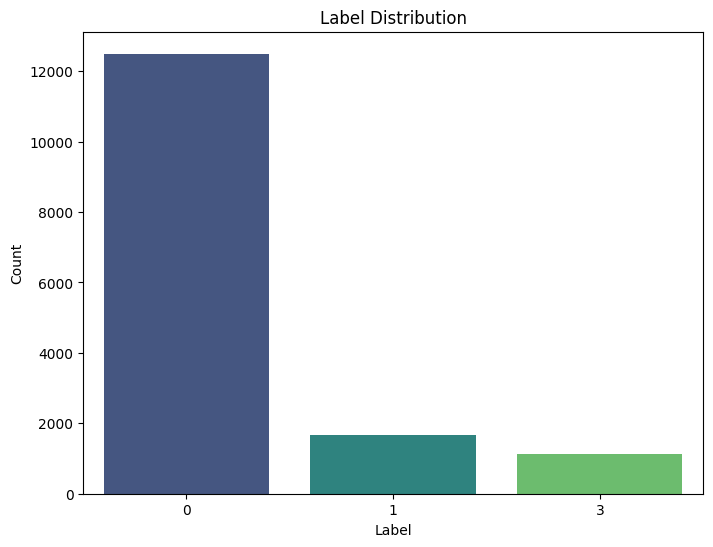


Class Distribution:
Label 0: 12494 samples (81.65%)
Label 1: 1666 samples (10.89%)
Label 3: 1142 samples (7.46%)


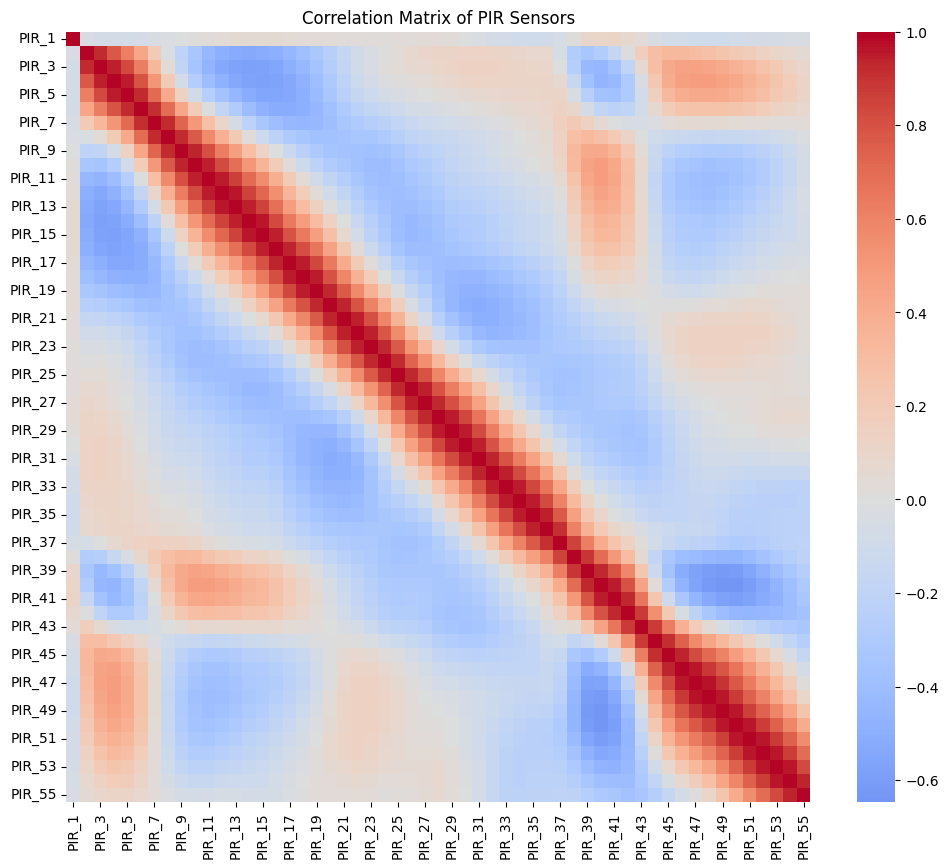


Pearson Correlation matrix between Temperature and Label:



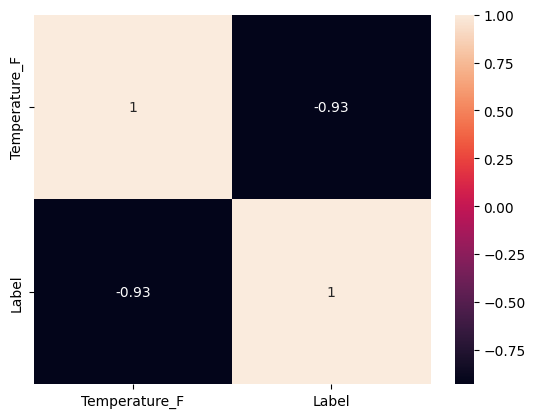

In [ ]:
# Primary anlysis based on original dataset

def Data_Analysis(df):
    # Display the first few rows of the dataset
    print("First few rows of the dataset:")
    display(df.head())
    # Dataset overview
    print("Dataset Overview:")
    print(f"Number of samples: {df.shape[0]}")
    print(f"Number of features: {df.shape[1]}")

    print("\n")
    print(df.info())

    # Label distribution visualization
    plt.figure(figsize=(8, 6))
    sns.countplot(x='Label', data=df, palette='viridis', legend = False)
    plt.title('Label Distribution')
    plt.xlabel('Label')
    plt.ylabel('Count')
    plt.show()

    # Display class distribution details
    print("\nClass Distribution:")
    label_counts = df['Label'].value_counts().sort_index()
    for label, count in label_counts.items():
        print(f"Label {label}: {count} samples ({(count / len(df)) * 100:.2f}%)")

    # Correlation matrix for PIR sensors
    pir_columns = [col for col in df.columns if col.startswith('PIR_')]

    if pir_columns:
        plt.figure(figsize=(12, 10))
        correlation_matrix = df[pir_columns].corr()
        sns.heatmap(correlation_matrix, cmap='coolwarm', center=0)
        plt.title('Correlation Matrix of PIR Sensors')
        plt.show()

    #Correlation matrix for Temperature and Label
    print('\nPearson Correlation matrix between Temperature and Label:\n')
    corr = df[['Temperature_F', 'Label']].corr(method='pearson')
    sns.heatmap(corr, annot=True)
    plt.show()

# Load and analyze the dataset
Data_Analysis(df)

# Feature Engineering

In [5]:
# Feature Engineering - PART 1

# Ensure 'Date' and 'Time' are parsed correctly
df['Datetime'] = pd.to_datetime(df['Date'] + ' ' + df['Time'])

# Extract temporal features
df['Hour'] = df['Datetime'].dt.hour
df['Minute'] = df['Datetime'].dt.minute
df['DayOfWeek'] = df['Datetime'].dt.dayofweek
df['Month'] = df['Datetime'].dt.month

df = df.drop(columns=['Date', 'Time', 'Datetime'])

#Question - Do we consider cyclic nature of minute, hour??

meta_features = ['Hour', 'Minute', 'DayOfWeek', 'Month', 'Temperature_F']

In [ ]:
# # Feature Engineering - PART 2

# # Interpolating pairwise PIR sensor values to generate more features per time stamp
# x = np.zeros((df.shape[0], 55+54+6))

# for i in range(df.shape[0]):
#   for j in range (0, 2):
#     x[i,j] = df.iloc[i,j]
#   for j in range(2, 55+54+2):
#     if(j%2 == 0):
#       x[i,j] = df.iloc[i,j//2]
#     else:
#       x[i,j] = (df.iloc[i,j//2] + df.iloc[i,j//2+1])/2
#   for j in range(55+54+2, 55+54+6):
#     x[i, j] = df.iloc[i, j-54]

# x_df = pd.DataFrame(x)

# x_df.columns = ['Label', 'Temperature_F'] + [f'PIR_{i}' for i in range(109)] + ['Hour', 'Minute', 'DayOfWeek', 'Month']

# df = x_df

# Secondary EDA

In [ ]:
#Secondary data analysis of the newly engineered features(meta columns)

def Data_Analysis_Meta(df):


# Data Normalisation/Standardisation

In [6]:
# Data Preprocessing - Data standardisation
scaler = StandardScaler()

numeric_cols = df.select_dtypes(include=["float64", "int64"]).columns
numeric_cols = numeric_cols.drop("Label")  # Exclude the Label column

# Question - saw somewhere that for meta columsn(fixed range values) MInMax scaler is much better than StandardScaler?

df[numeric_cols] = scaler.fit_transform(df[numeric_cols])

In [11]:
df.head()   #Final preprocessed dataset

,Label,Temperature_F,PIR_1,PIR_2,PIR_3,PIR_4,PIR_5,PIR_6,PIR_7,PIR_8,PIR_9,PIR_10,PIR_11,PIR_12,PIR_13,PIR_14,PIR_15,PIR_16,PIR_17,PIR_18,PIR_19,PIR_20,PIR_21,PIR_22,PIR_23,PIR_24,PIR_25,PIR_26,PIR_27,PIR_28,PIR_29,PIR_30,PIR_31,PIR_32,PIR_33,PIR_34,PIR_35,PIR_36,PIR_37,PIR_38,PIR_39,PIR_40,PIR_41,PIR_42,PIR_43,PIR_44,PIR_45,PIR_46,PIR_47,PIR_48,PIR_49,PIR_50,PIR_51,PIR_52,PIR_53,PIR_54,PIR_55,Hour,Minute,DayOfWeek,Month
0,0,0.245676,-0.055875,-0.494950,-0.551045,-0.616061,-0.558023,-0.230890,0.165129,0.450680,0.525723,0.515734,0.370196,0.184010,0.201863,0.280221,0.477645,0.416393,0.137928,0.257101,0.352263,0.197236,0.078255,-0.148685,-0.170861,-0.087877,0.050418,0.013493,-0.077806,-0.103976,-0.238827,-0.288882,-0.170143,0.069416,0.078371,0.107238,0.145402,0.082729,0.129407,0.399382,0.512783,0.475682,0.467011,0.333056,-0.012290,-0.350064,-0.426881,-0.472273,-0.577291,-0.614463,-0.574078,-0.572173,-0.483428,-0.355541,-0.314113,-0.376149,-0.267425,19,19,3,8
1,1,0.245676,-0.055853,-0.180633,-0.333270,-0.513508,-0.663652,-0.484048,-0.277654,0.084387,0.470167,0.679292,0.679981,0.676146,0.773828,0.621484,0.658225,0.397845,0.238492,0.045904,-0.161902,-0.186373,-0.146818,-0.138325,-0.143695,-0.182316,-0.089082,0.040904,-0.013779,-0.067306,-0.178165,-0.175699,0.029915,0.153468,0.054383,-0.137586,-0.293455,-0.145031,-0.059855,0.127043,0.406865,0.658589,0.930333,0.821685,0.440365,0.014222,-0.282181,-0.565744,-0.660100,-0.654840,-0.554029,-0.425187,-0.510887,-0.529183,-0.513220,-0.404123,-0.205231,19,20,3,8
2,0,0.245676,-0.055861,-0.373279,-0.488606,-0.507475,-0.358319,-0.255089,-0.048284,0.160448,0.399285,0.526638,0.583173,0.544447,0.656956,0.555027,0.510813,0.475745,0.203108,0.047807,0.112979,0.048281,-0.189786,-0.136253,-0.106080,-0.064792,-0.127713,-0.138317,-0.168683,-0.352515,-0.291400,-0.208625,-0.134716,-0.203240,-0.059561,0.017668,0.193939,0.080640,0.394786,0.548397,0.601048,0.578221,0.449076,0.145808,-0.063265,-0.254513,-0.352722,-0.488964,-0.566144,-0.612848,-0.552358,-0.484681,-0.432172,-0.423068,-0.431114,-0.341720,-0.409584,19,20,3,8
3,0,0.245676,-0.055899,-0.995152,-1.059694,-0.671862,-0.219681,0.072528,0.414444,0.640832,0.719211,0.775610,0.555011,0.433544,0.417899,0.314347,0.295222,0.303253,0.076472,0.163870,0.192081,0.097252,0.057794,0.104101,0.148866,0.153465,-0.110544,-0.212114,-0.317390,-0.340292,-0.323754,-0.233319,-0.176395,-0.168389,-0.125529,-0.087825,-0.040657,-0.028016,0.162322,0.807033,0.946753,0.643346,0.206953,-0.002207,-0.110161,-0.459548,-0.593285,-0.575759,-0.456263,-0.574085,-0.761205,-0.654415,-0.542007,-0.396057,-0.188902,-0.051221,0.030219,19,20,3,8
4,0,0.245676,-0.055863,-0.586203,-0.630236,-0.519540,-0.231234,0.035299,0.280811,0.264531,0.234533,0.379435,0.440602,0.284517,0.426753,0.547843,0.363400,0.255029,0.350229,0.205729,0.294914,0.170709,0.045517,-0.038868,-0.116529,-0.161329,-0.237168,-0.368142,-0.253363,-0.122311,-0.052796,0.139156,0.190379,0.053016,-0.085548,-0.205261,-0.196380,-0.301747,0.012147,0.469608,0.646652,0.665517,0.650845,0.511388,0.020334,-0.350064,-0.634887,-0.759362,-0.481743,-0.276907,-0.445428,-0.629918,-0.525531,-0.318883,-0.318218,-0.339568,-0.094170,19,21,3,8


In [8]:
df.head

<bound method NDFrame.head of        Label  Temperature_F      PIR_1      PIR_2      PIR_3      PIR_4  \
0          0       0.245676  -0.055875  -0.494950  -0.551045  -0.616061   
1          1       0.245676  -0.055853  -0.180633  -0.333270  -0.513508   
2          0       0.245676  -0.055861  -0.373279  -0.488606  -0.507475   
3          0       0.245676  -0.055899  -0.995152  -1.059694  -0.671862   
4          0       0.245676  -0.055863  -0.586203  -0.630236  -0.519540   
5          0       0.245676  -0.055875  -0.888690  -0.873900  -0.462231   
6          0       0.245676  -0.055865  -0.527057  -0.587594  -0.331023   
7          0       0.245676  -0.055837  -0.136697  -0.427690  -0.584390   
8          0       0.245676  -0.055853  -0.669006  -0.829736  -0.702025   
9          0       0.245676  -0.055847  -0.261747  -0.471854  -0.640191   
10         0       0.289420  -0.055869  -0.555785  -0.607392  -0.445641   
11         0       0.245676  -0.055845  -0.298924  -0.677446  -0.833233   
12         0       0.289420  -0.055841  -0.586203  -0.639373  -0.519540   
13         0       0.289420  -0.055834  -0.126557  -0.286060  -0.469772   
14         0       0.289420  -0.055814  -0.200912  -0.357636  -0.519540   
15         0       0.289420  -0.055821  -0.060652  -0.372865  -0.543670   
16         0       0.289420  -0.055879  -0.429045  -0.374388  -0.324990   
17         0       0.289420  -0.055869  -1.001911  -1.032282  -0.634159   
18         0       0.289420  -0.055885  -0.567614  -0.613484  -0.558752   
19         0       0.289420  -0.055876  -0.807576  -0.674400  -0.362694   
20         0       0.289420  -0.055856  -0.349621  -0.219052  -0.125916   
21         0       0.289420  -0.055827  -0.636899  -0.822121  -0.385316   
22         0       0.289420  -0.055855  -0.334412  -0.353067  -0.459215   
23         0       0.289420  -0.055813   0.086367  -0.325655  -0.569309   
24         0       0.289420  -0.055840  -0.369899  -0.470331  -0.394365   
25         0       0.289420  -0.055790   0.106645  -0.397231  -0.608520   
26         0       0.289420  -0.055833  -0.177254  -0.360682  -0.415479   
27         0       0.289420  -0.055822   0.042430  -0.494697  -0.700517   
28         0       0.289420  -0.055862  -0.403696  -0.671354  -0.688452   
29         0       0.289420  -0.055867  -0.648728  -0.531247  -0.315941   
30         0       0.289420  -0.055876  -0.151905  -0.089605  -0.036936   
31         0       0.289420  -0.055871  -0.657177  -0.459670  -0.166636   
32         0       0.289420  -0.055815  -0.177254  -0.382002  -0.424527   
33         0       0.289420  -0.055860  -0.650418  -0.610438  -0.371743   
34         0       0.289420  -0.055852  -0.275266  -0.196208  -0.332531   
35         0       0.289420  -0.055855  -0.530437  -0.445964  -0.252599   
36         0       0.289420  -0.055857  -0.231329  -0.383525  -0.570817   
37         0       0.289420  -0.055755   0.420961  -0.104834  -0.525573   
38         0       0.289420  -0.055833   0.017082  -0.188594  -0.394365   
39         0       0.289420  -0.055897  -0.746741  -0.643942  -0.447150   
40         0       0.289420  -0.055838  -0.239779  -0.427690  -0.647732   
41         0       0.289420  -0.055883  -0.630139  -0.327178  -0.062574   
42         0       0.289420  -0.055830  -0.011646  -0.135292  -0.329515   
43         0       0.289420  -0.055844  -0.329342  -0.281491  -0.251091   
44         0       0.289420  -0.055856  -0.743361  -0.639373  -0.278238   
45         0       0.289420  -0.055869  -0.214431  -0.217529  -0.181717   
46         0       0.289420  -0.055844   0.003563  -0.196208  -0.288795   
47         0       0.289420  -0.055865  -0.417215  -0.397231  -0.346104   
48         0       0.289420  -0.055800   0.297601  -0.080468  -0.347612   
49         0       0.289420  -0.055834  -0.107969  -0.174888  -0.258632   
50         0       0.289420  -0.055800   0.187759  -0.249510  -0.418495   
51         0       0.289420  -0.055873  -0.209361  -0.182502  -0.28728

In [10]:
PIR_columns = [f'PIR_{i}' for i in range(1,56)] + ['Label']
PIR_data = df[PIR_columns]

In [12]:
PIR_data.head()

,PIR_1,PIR_2,PIR_3,PIR_4,PIR_5,PIR_6,PIR_7,PIR_8,PIR_9,PIR_10,PIR_11,PIR_12,PIR_13,PIR_14,PIR_15,PIR_16,PIR_17,PIR_18,PIR_19,PIR_20,PIR_21,PIR_22,PIR_23,PIR_24,PIR_25,PIR_26,PIR_27,PIR_28,PIR_29,PIR_30,PIR_31,PIR_32,PIR_33,PIR_34,PIR_35,PIR_36,PIR_37,PIR_38,PIR_39,PIR_40,PIR_41,PIR_42,PIR_43,PIR_44,PIR_45,PIR_46,PIR_47,PIR_48,PIR_49,PIR_50,PIR_51,PIR_52,PIR_53,PIR_54,PIR_55,Label
0,-0.055875,-0.494950,-0.551045,-0.616061,-0.558023,-0.230890,0.165129,0.450680,0.525723,0.515734,0.370196,0.184010,0.201863,0.280221,0.477645,0.416393,0.137928,0.257101,0.352263,0.197236,0.078255,-0.148685,-0.170861,-0.087877,0.050418,0.013493,-0.077806,-0.103976,-0.238827,-0.288882,-0.170143,0.069416,0.078371,0.107238,0.145402,0.082729,0.129407,0.399382,0.512783,0.475682,0.467011,0.333056,-0.012290,-0.350064,-0.426881,-0.472273,-0.577291,-0.614463,-0.574078,-0.572173,-0.483428,-0.355541,-0.314113,-0.376149,-0.267425,0
1,-0.055853,-0.180633,-0.333270,-0.513508,-0.663652,-0.484048,-0.277654,0.084387,0.470167,0.679292,0.679981,0.676146,0.773828,0.621484,0.658225,0.397845,0.238492,0.045904,-0.161902,-0.186373,-0.146818,-0.138325,-0.143695,-0.182316,-0.089082,0.040904,-0.013779,-0.067306,-0.178165,-0.175699,0.029915,0.153468,0.054383,-0.137586,-0.293455,-0.145031,-0.059855,0.127043,0.406865,0.658589,0.930333,0.821685,0.440365,0.014222,-0.282181,-0.565744,-0.660100,-0.654840,-0.554029,-0.425187,-0.510887,-0.529183,-0.513220,-0.404123,-0.205231,1
2,-0.055861,-0.373279,-0.488606,-0.507475,-0.358319,-0.255089,-0.048284,0.160448,0.399285,0.526638,0.583173,0.544447,0.656956,0.555027,0.510813,0.475745,0.203108,0.047807,0.112979,0.048281,-0.189786,-0.136253,-0.106080,-0.064792,-0.127713,-0.138317,-0.168683,-0.352515,-0.291400,-0.208625,-0.134716,-0.203240,-0.059561,0.017668,0.193939,0.080640,0.394786,0.548397,0.601048,0.578221,0.449076,0.145808,-0.063265,-0.254513,-0.352722,-0.488964,-0.566144,-0.612848,-0.552358,-0.484681,-0.432172,-0.423068,-0.431114,-0.341720,-0.409584,0
3,-0.055899,-0.995152,-1.059694,-0.671862,-0.219681,0.072528,0.414444,0.640832,0.719211,0.775610,0.555011,0.433544,0.417899,0.314347,0.295222,0.303253,0.076472,0.163870,0.192081,0.097252,0.057794,0.104101,0.148866,0.153465,-0.110544,-0.212114,-0.317390,-0.340292,-0.323754,-0.233319,-0.176395,-0.168389,-0.125529,-0.087825,-0.040657,-0.028016,0.162322,0.807033,0.946753,0.643346,0.206953,-0.002207,-0.110161,-0.459548,-0.593285,-0.575759,-0.456263,-0.574085,-0.761205,-0.654415,-0.542007,-0.396057,-0.188902,-0.051221,0.030219,0
4,-0.055863,-0.586203,-0.630236,-0.519540,-0.231234,0.035299,0.280811,0.264531,0.234533,0.379435,0.440602,0.284517,0.426753,0.547843,0.363400,0.255029,0.350229,0.205729,0.294914,0.170709,0.045517,-0.038868,-0.116529,-0.161329,-0.237168,-0.368142,-0.253363,-0.122311,-0.052796,0.139156,0.190379,0.053016,-0.085548,-0.205261,-0.196380,-0.301747,0.012147,0.469608,0.646652,0.665517,0.650845,0.511388,0.020334,-0.350064,-0.634887,-0.759362,-0.481743,-0.276907,-0.445428,-0.629918,-0.525531,-0.318883,-0.318218,-0.339568,-0.094170,0


In [13]:
Meta_columns = ['Temperature_F', 'Hour', 'Minute', 'DayOfWeek', 'Month']
Meta_data = df[Meta_columns]

In [ ]:
Meta_data.head(10)


,Temperature_F,Hour,Minute,DayOfWeek,Month
0,0.245676,0.954478,-0.613620,-1.023796,-1.887176
1,0.245676,0.954478,-0.555507,-1.023796,-1.887176
2,0.245676,0.954478,-0.555507,-1.023796,-1.887176
3,0.245676,0.954478,-0.555507,-1.023796,-1.887176
4,0.245676,0.954478,-0.497395,-1.023796,-1.887176
5,0.245676,0.954478,-0.497395,-1.023796,-1.887176
6,0.245676,0.954478,-0.497395,-1.023796,-1.887176
7,0.245676,0.954478,-0.497395,-1.023796,-1.887176
8,0.245676,0.954478,-0.439282,-1.023796,-1.887176
9,0.245676,0.954478,-0.439282,-1.023796,-1.887176


In [ ]:
PIR_data.head(10)

,PIR_0,PIR_1,PIR_2,PIR_3,PIR_4,PIR_5,PIR_6,PIR_7,PIR_8,PIR_9,PIR_10,PIR_11,PIR_12,PIR_13,PIR_14,PIR_15,PIR_16,PIR_17,PIR_18,PIR_19,PIR_20,PIR_21,PIR_22,PIR_23,PIR_24,PIR_25,PIR_26,PIR_27,PIR_28,PIR_29,PIR_30,PIR_31,PIR_32,PIR_33,PIR_34,PIR_35,PIR_36,PIR_37,PIR_38,PIR_39,PIR_40,PIR_41,PIR_42,PIR_43,PIR_44,PIR_45,PIR_46,PIR_47,PIR_48,PIR_49,PIR_50,PIR_51,PIR_52,PIR_53,PIR_54,PIR_55,PIR_56,PIR_57,PIR_58,PIR_59,PIR_60,PIR_61,PIR_62,PIR_63,PIR_64,PIR_65,PIR_66,PIR_67,PIR_68,PIR_69,PIR_70,PIR_71,PIR_72,PIR_73,PIR_74,PIR_75,PIR_76,PIR_77,PIR_78,PIR_79,PIR_80,PIR_81,PIR_82,PIR_83,PIR_84,PIR_85,PIR_86,PIR_87,PIR_88,PIR_89,PIR_90,PIR_91,PIR_92,PIR_93,PIR_94,PIR_95,PIR_96,PIR_97,PIR_98,PIR_99,PIR_100,PIR_101,PIR_102,PIR_103,PIR_104,PIR_105,PIR_106,PIR_107,PIR_108,Label
0,0.245676,-0.055874,-0.055875,-0.055944,-0.494950,-0.535025,-0.551045,-0.591841,-0.616061,-0.595164,-0.558023,-0.411659,-0.230890,-0.040599,0.165129,0.314171,0.450680,0.498168,0.525723,0.528330,0.515734,0.447967,0.370196,0.279563,0.184010,0.194594,0.201863,0.243975,0.280221,0.381752,0.477645,0.453421,0.416393,0.281833,0.137928,0.199226,0.257101,0.307502,0.352263,0.280735,0.197236,0.140089,0.078255,-0.035004,-0.148685,-0.162059,-0.170861,-0.131657,-0.087877,-0.019885,0.050418,0.032361,0.013493,-0.033058,-0.077806,-0.092583,-0.103976,-0.173862,-0.238827,-0.266700,-0.288882,-0.233162,-0.170143,-0.050141,0.069416,0.075027,0.078371,0.093931,0.107238,0.127637,0.145402,0.116187,0.082729,0.108872,0.129407,0.287074,0.399382,0.472744,0.512783,0.502623,0.475682,0.477421,0.467011,0.412986,0.333056,0.177566,-0.012290,-0.189309,-0.350064,-0.398756,-0.426881,-0.457676,-0.472273,-0.531099,-0.577291,-0.599922,-0.614463,-0.599804,-0.574078,-0.578531,-0.572173,-0.534485,-0.483428,-0.424869,-0.355541,-0.338631,-0.314113,-0.347892,-0.376149,0.0
1,0.245676,-0.055852,-0.055853,-0.055878,-0.180633,-0.266177,-0.333270,-0.429731,-0.513508,-0.591975,-0.663652,-0.589812,-0.484048,-0.392987,-0.277654,-0.099009,0.084387,0.286769,0.470167,0.586064,0.679292,0.689126,0.679981,0.685867,0.676146,0.731050,0.773828,0.707510,0.621484,0.646532,0.658225,0.535910,0.397845,0.323367,0.238492,0.144941,0.045904,-0.056683,-0.161902,-0.176954,-0.186373,-0.169357,-0.146818,-0.144674,-0.138325,-0.143058,-0.143695,-0.165733,-0.182316,-0.138881,-0.089082,-0.023935,0.040904,0.013455,-0.013779,-0.041444,-0.067306,-0.124524,-0.178165,-0.179000,-0.175699,-0.074587,0.029915,0.093617,0.153468,0.104805,0.054383,-0.042301,-0.137586,-0.217401,-0.293455,-0.223551,-0.145031,-0.104631,-0.059855,0.043706,0.127043,0.285027,0.406865,0.546212,0.658589,0.799215,0.930333,0.896097,0.821685,0.664868,0.440365,0.232227,0.014222,-0.144127,-0.282181,-0.436510,-0.565744,-0.619964,-0.660100,-0.662097,-0.654840,-0.610573,-0.554029,-0.495710,-0.425187,-0.472090,-0.510887,-0.524366,-0.529183,-0.526364,-0.513220,-0.464623,-0.404123,1.0
2,0.245676,-0.055860,-0.055861,-0.055913,-0.373279,-0.442685,-0.488606,-0.505024,-0.507475,-0.441310,-0.358319,-0.315456,-0.255089,-0.158718,-0.048284,0.057081,0.160448,0.287766,0.399285,0.471542,0.526638,0.563107,0.583173,0.570159,0.544447,0.605553,0.656956,0.614442,0.555027,0.538965,0.510813,0.500290,0.475745,0.345078,0.203108,0.127798,0.047807,0.080746,0.112979,0.082539,0.048281,-0.071746,-0.189786,-0.165564,-0.136253,-0.123001,-0.106080,-0.086932,-0.064792,-0.097773,-0.127713,-0.135444,-0.138317,-0.155684,-0.168683,-0.265832,-0.352515,-0.325986,-0.291400,-0.253287,-0.208625,-0.174353,-0.134716,-0.171863,-0.203240,-0.132395,-0.059561,-0.021109,0.017668,0.106326,0.193939,0.140156,0.080640,0.244834,0.394786,0.496506,0.548397,0.592200,0.601048,0.599971,0.578221,0.522559,0.449076,0.316198,0.145808,0.049845,-0.063265,-0.165370,-0.254513,-0.312589,-0.352722,-0.430337,-0.488964,-0.533568,-0.566144,-0.593462,-0.612848,-0.588206,-0.552358,-0.524180,-0.484681,-0.463952,-0.432172,-0.431502,-0.423068,-0.430992,-0.431114,-0.391401,-0.341720,0.0
3,0.245676,-0.055897,-0.055899,-0.056036,-0.995152,-1.049842,-1.059694,-0.876879,-0.67

In [14]:
X_Meta = Meta_data.values
X_Meta

array([[ 0.24567575, 19.        , 19.        ,  3.        ,  8.        ],
       [ 0.24567575, 19.        , 20.        ,  3.        ,  8.        ],
       [ 0.24567575, 19.        , 20.        ,  3.        ,  8.        ],
       ...,
       [ 0.3331651 ,  4.        , 34.        ,  1.        , 10.        ],
       [ 0.3331651 ,  4.        , 35.        ,  1.        , 10.        ],
       [ 0.3331651 ,  4.        , 35.        ,  1.        , 10.        ]])

# Main Model Architecture + Implementation + Cross validation

# Model Architecture - CNN BILSTM

In [ ]:
def create_model():
    # Time series input branch
    ts_input = Input(shape=(1, 109, 1), name='ts_input')
    x = TimeDistributed(Conv1D(256, 3, activation='relu'))(ts_input)
    x = TimeDistributed(MaxPooling1D(2))(x)
    x = TimeDistributed(Conv1D(128, 3, activation='relu'))(x)
    x = TimeDistributed(MaxPooling1D(2))(x)
    x = TimeDistributed(Flatten())(x)
    x = Bidirectional(LSTM(128, return_sequences=True))(x)
    ts_features = Bidirectional(LSTM(50))(x)

    # Metadata input branch
    meta_input = Input(shape=(5,), name='meta_input')  # 5 metadata columns

    # Concatenate features
    merged = Concatenate()([ts_features, meta_input])

    # Continue with original architecture
    x = Dropout(0.5)(merged)
    outputs = Dense(3, activation='softmax')(x)

    model = Model(inputs=[ts_input, meta_input], outputs=outputs)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Training and Cross Validation

In [ ]:
X = PIR_data.iloc[:, :-1].values  # first 109 columns: the PIR time series
y = PIR_data.iloc[:, -1].values   # last column: the class label


X = X.reshape((X.shape[0], 1, 109, 1))



label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)  # now y becomes 0, 1, 2
y_categorical = to_categorical(y_encoded)

# Set up cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
fold_no = 1

f1_scores = []
accuracies = []


for train_index, test_index in kf.split(X):
    print(f"\n--- Fold {fold_no} ---")

    # --- Build CNN-LSTM Model ---
    model = create_model()
    model.summary()
    X_train, X_test = X[train_index], X[test_index]
    meta_train, meta_test = X_Meta[train_index], X_Meta[test_index]
    y_train, y_test = y_categorical[train_index], y_categorical[test_index]

    # ======== Modified Resampling ========
    ros = RandomOverSampler(random_state=42)
    y_train_labels = np.argmax(y_train, axis=1)

    # Flatten time series and combine with metadata
    X_train_flat = X_train.reshape(X_train.shape[0], -1)
    combined_train = np.hstack([X_train_flat, meta_train])

    # Resample combined data
    combined_resampled, y_resampled = ros.fit_resample(combined_train, y_train_labels)

    # Split back into components
    X_resampled = combined_resampled[:, :-5].reshape(-1, 1, 109, 1)
    meta_resampled = combined_resampled[:, -5:]
    y_resampled = to_categorical(y_resampled)

    # ======== Modified Training ========
    history = model.fit(
        [X_resampled, meta_resampled], y_resampled,
        validation_data=([X_test, meta_test], y_test),
        epochs=20,
        batch_size=32
    )



    y_pred = model.predict([X_test, meta_test])
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_test, axis=1)

    acc = accuracy_score(y_true_classes, y_pred_classes)
    f1 = f1_score(y_true_classes, y_pred_classes, average='macro')

    print("Accuracy:", acc)
    print("F1 Macro Score:", f1)
    # print(classification_report(y_true_classes, y_pred_classes, target_names=label_encoder.classes_))

    accuracies.append(acc)
    f1_scores.append(f1)

    fold_no += 1

    # y_pred_labels = label_encoder.inverse_transform(y_pred_classes)
    # y_true_labels = label_encoder.inverse_transform(y_true_classes)

    # from sklearn.metrics import classification_report
    # print(classification_report(y_true_classes, y_pred_classes))


--- Fold 1 ---


Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ ts_input            │ (None, 1, 109, 1) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_5  │ (None, 1, 107,    │      1,024 │ ts_input[0][0]    │
│ (TimeDistributed)   │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_6  │ (None, 1, 53,     │          0 │ time_distributed… │
│ (TimeDistributed)   │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_7  │ (None, 1, 51,     │     98,432 │ time_distributed… │
│ (TimeDistributed)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_8  │ (None, 1, 25,     │          0 │ time_distributed… │
│ (TimeDistributed)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_9  │ (None, 1, 3200)   │          0 │ time_distributed… │
│ (TimeDistributed)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_2     │ (None, 1, 256)    │  3,408,896 │ time_distributed… │
│ (Bidirectional)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_3     │ (None, 100)       │    122,800 │ bidirectional_2[… │
│ (Bidirectional)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ meta_input          │ (None, 5)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 105)       │          0 │ bidirectional_3[… │
│ (Concatenate)       │                   │            │ meta_input[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 105)       │          0 │ concatenate[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 3)         │        318 │ dropout_1[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 3,631,470 (13.85 MB)

 Trainable params: 3,631,470 (13.85 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 121s 118ms/step - accuracy: 0.9491 - loss: 0.1281 - val_accuracy: 0.9765 - val_loss: 0.0574
Epoch 2/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 137s 112ms/step - accuracy: 0.9911 - loss: 0.0257 - val_accuracy: 0.9925 - val_loss: 0.0211
Epoch 3/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 141s 112ms/step - accuracy: 0.9936 - loss: 0.0172 - val_accuracy: 0.9882 - val_loss: 0.0312
Epoch 4/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 143s 113ms/step - accuracy: 0.9949 - loss: 0.0142 - val_accuracy: 0.9944 - val_loss: 0.0179
Epoch 5/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 140s 111ms/step - accuracy: 0.9951 - loss: 0.0165 - val_accuracy: 0.9846 - val_loss: 0.0460
Epoch 6/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 144s 112ms/step - accuracy: 0.9959 - loss: 0.0124 - val_accuracy: 0.9837 - val_loss: 0.0633
Epoch 7/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 141s 111ms/step - accuracy: 0.9970 - loss: 0.0093 - val_accuracy: 0.9922 - val_loss: 0.0245
Epoch 8/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 105s 111ms/step - accuracy: 0.9981 -

Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ ts_input            │ (None, 1, 109, 1) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_10 │ (None, 1, 107,    │      1,024 │ ts_input[0][0]    │
│ (TimeDistributed)   │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_11 │ (None, 1, 53,     │          0 │ time_distributed… │
│ (TimeDistributed)   │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_12 │ (None, 1, 51,     │     98,432 │ time_distributed… │
│ (TimeDistributed)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_13 │ (None, 1, 25,     │          0 │ time_distributed… │
│ (TimeDistributed)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_14 │ (None, 1, 3200)   │          0 │ time_distributed… │
│ (TimeDistributed)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_4     │ (None, 1, 256)    │  3,408,896 │ time_distributed… │
│ (Bidirectional)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_5     │ (None, 100)       │    122,800 │ bidirectional_4[… │
│ (Bidirectional)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ meta_input          │ (None, 5)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 105)       │          0 │ bidirectional_5[… │
│ (Concatenate)       │                   │            │ meta_input[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 105)       │          0 │ concatenate_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 3)         │        318 │ dropout_2[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 3,631,470 (13.85 MB)

 Trainable params: 3,631,470 (13.85 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
937/937 ━━━━━━━━━━━━━━━━━━━━ 117s 114ms/step - accuracy: 0.9204 - loss: 0.1661 - val_accuracy: 0.9781 - val_loss: 0.0545
Epoch 2/20
937/937 ━━━━━━━━━━━━━━━━━━━━ 102s 109ms/step - accuracy: 0.9922 - loss: 0.0226 - val_accuracy: 0.9879 - val_loss: 0.0283
Epoch 3/20
937/937 ━━━━━━━━━━━━━━━━━━━━ 104s 111ms/step - accuracy: 0.9938 - loss: 0.0159 - val_accuracy: 0.9788 - val_loss: 0.0685
Epoch 4/20
937/937 ━━━━━━━━━━━━━━━━━━━━ 104s 111ms/step - accuracy: 0.9937 - loss: 0.0180 - val_accuracy: 0.9879 - val_loss: 0.0323
Epoch 5/20
937/937 ━━━━━━━━━━━━━━━━━━━━ 143s 112ms/step - accuracy: 0.9961 - loss: 0.0120 - val_accuracy: 0.9820 - val_loss: 0.0650
Epoch 6/20
937/937 ━━━━━━━━━━━━━━━━━━━━ 143s 113ms/step - accuracy: 0.9967 - loss: 0.0095 - val_accuracy: 0.9866 - val_loss: 0.0263
Epoch 7/20
937/937 ━━━━━━━━━━━━━━━━━━━━ 145s 116ms/step - accuracy: 0.9966 - loss: 0.0097 - val_accuracy: 0.9873 - val_loss: 0.0526
Epoch 8/20
937/937 ━━━━━━━━━━━━━━━━━━━━ 141s 115ms/step - accuracy: 0.9983 -

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ ts_input            │ (None, 1, 109, 1) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_15 │ (None, 1, 107,    │      1,024 │ ts_input[0][0]    │
│ (TimeDistributed)   │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_16 │ (None, 1, 53,     │          0 │ time_distributed… │
│ (TimeDistributed)   │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_17 │ (None, 1, 51,     │     98,432 │ time_distributed… │
│ (TimeDistributed)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_18 │ (None, 1, 25,     │          0 │ time_distributed… │
│ (TimeDistributed)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_19 │ (None, 1, 3200)   │          0 │ time_distributed… │
│ (TimeDistributed)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_6     │ (None, 1, 256)    │  3,408,896 │ time_distributed… │
│ (Bidirectional)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_7     │ (None, 100)       │    122,800 │ bidirectional_6[… │
│ (Bidirectional)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ meta_input          │ (None, 5)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 105)       │          0 │ bidirectional_7[… │
│ (Concatenate)       │                   │            │ meta_input[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 105)       │          0 │ concatenate_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 3)         │        318 │ dropout_3[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 3,631,470 (13.85 MB)

 Trainable params: 3,631,470 (13.85 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
936/936 ━━━━━━━━━━━━━━━━━━━━ 115s 113ms/step - accuracy: 0.9465 - loss: 0.1364 - val_accuracy: 0.9784 - val_loss: 0.0611
Epoch 2/20
936/936 ━━━━━━━━━━━━━━━━━━━━ 138s 109ms/step - accuracy: 0.9915 - loss: 0.0244 - val_accuracy: 0.9925 - val_loss: 0.0155
Epoch 3/20
936/936 ━━━━━━━━━━━━━━━━━━━━ 143s 111ms/step - accuracy: 0.9937 - loss: 0.0179 - val_accuracy: 0.9951 - val_loss: 0.0134
Epoch 4/20
936/936 ━━━━━━━━━━━━━━━━━━━━ 102s 109ms/step - accuracy: 0.9939 - loss: 0.0168 - val_accuracy: 0.9895 - val_loss: 0.0199
Epoch 5/20
936/936 ━━━━━━━━━━━━━━━━━━━━ 143s 110ms/step - accuracy: 0.9958 - loss: 0.0115 - val_accuracy: 0.9944 - val_loss: 0.0163
Epoch 6/20
936/936 ━━━━━━━━━━━━━━━━━━━━ 103s 110ms/step - accuracy: 0.9973 - loss: 0.0093 - val_accuracy: 0.9912 - val_loss: 0.0202
Epoch 7/20
936/936 ━━━━━━━━━━━━━━━━━━━━ 142s 110ms/step - accuracy: 0.9975 - loss: 0.0084 - val_accuracy: 0.9977 - val_loss: 0.0119
Epoch 8/20
936/936 ━━━━━━━━━━━━━━━━━━━━ 102s 109ms/step - accuracy: 0.9975 -

Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ ts_input            │ (None, 1, 109, 1) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_20 │ (None, 1, 107,    │      1,024 │ ts_input[0][0]    │
│ (TimeDistributed)   │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_21 │ (None, 1, 53,     │          0 │ time_distributed… │
│ (TimeDistributed)   │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_22 │ (None, 1, 51,     │     98,432 │ time_distributed… │
│ (TimeDistributed)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_23 │ (None, 1, 25,     │          0 │ time_distributed… │
│ (TimeDistributed)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_24 │ (None, 1, 3200)   │          0 │ time_distributed… │
│ (TimeDistributed)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_8     │ (None, 1, 256)    │  3,408,896 │ time_distributed… │
│ (Bidirectional)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_9     │ (None, 100)       │    122,800 │ bidirectional_8[… │
│ (Bidirectional)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ meta_input          │ (None, 5)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 105)       │          0 │ bidirectional_9[… │
│ (Concatenate)       │                   │            │ meta_input[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 105)       │          0 │ concatenate_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 3)         │        318 │ dropout_4[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 3,631,470 (13.85 MB)

 Trainable params: 3,631,470 (13.85 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 114s 112ms/step - accuracy: 0.9450 - loss: 0.1339 - val_accuracy: 0.9745 - val_loss: 0.0795
Epoch 2/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 105s 111ms/step - accuracy: 0.9902 - loss: 0.0272 - val_accuracy: 0.9706 - val_loss: 0.0893
Epoch 3/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 139s 108ms/step - accuracy: 0.9924 - loss: 0.0216 - val_accuracy: 0.9931 - val_loss: 0.0152
Epoch 4/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 142s 109ms/step - accuracy: 0.9944 - loss: 0.0169 - val_accuracy: 0.9895 - val_loss: 0.0270
Epoch 5/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 102s 108ms/step - accuracy: 0.9953 - loss: 0.0141 - val_accuracy: 0.9951 - val_loss: 0.0112
Epoch 6/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 146s 113ms/step - accuracy: 0.9957 - loss: 0.0133 - val_accuracy: 0.9892 - val_loss: 0.0513
Epoch 7/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 138s 108ms/step - accuracy: 0.9955 - loss: 0.0122 - val_accuracy: 0.9948 - val_loss: 0.0131
Epoch 8/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 142s 109ms/step - accuracy: 0.9982 -

Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ ts_input            │ (None, 1, 109, 1) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_25 │ (None, 1, 107,    │      1,024 │ ts_input[0][0]    │
│ (TimeDistributed)   │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_26 │ (None, 1, 53,     │          0 │ time_distributed… │
│ (TimeDistributed)   │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_27 │ (None, 1, 51,     │     98,432 │ time_distributed… │
│ (TimeDistributed)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_28 │ (None, 1, 25,     │          0 │ time_distributed… │
│ (TimeDistributed)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_29 │ (None, 1, 3200)   │          0 │ time_distributed… │
│ (TimeDistributed)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_10    │ (None, 1, 256)    │  3,408,896 │ time_distributed… │
│ (Bidirectional)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_11    │ (None, 100)       │    122,800 │ bidirectional_10… │
│ (Bidirectional)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ meta_input          │ (None, 5)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_4       │ (None, 105)       │          0 │ bidirectional_11… │
│ (Concatenate)       │                   │            │ meta_input[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 105)       │          0 │ concatenate_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_5 (Dense)     │ (None, 3)         │        318 │ dropout_5[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 3,631,470 (13.85 MB)

 Trainable params: 3,631,470 (13.85 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
936/936 ━━━━━━━━━━━━━━━━━━━━ 113s 109ms/step - accuracy: 0.9469 - loss: 0.1300 - val_accuracy: 0.9654 - val_loss: 0.0932
Epoch 2/20
936/936 ━━━━━━━━━━━━━━━━━━━━ 102s 108ms/step - accuracy: 0.9917 - loss: 0.0249 - val_accuracy: 0.9810 - val_loss: 0.0567
Epoch 3/20
936/936 ━━━━━━━━━━━━━━━━━━━━ 144s 111ms/step - accuracy: 0.9933 - loss: 0.0192 - val_accuracy: 0.9817 - val_loss: 0.0612
Epoch 4/20
936/936 ━━━━━━━━━━━━━━━━━━━━ 100s 107ms/step - accuracy: 0.9950 - loss: 0.0147 - val_accuracy: 0.9915 - val_loss: 0.0257
Epoch 5/20
936/936 ━━━━━━━━━━━━━━━━━━━━ 101s 107ms/step - accuracy: 0.9952 - loss: 0.0127 - val_accuracy: 0.9859 - val_loss: 0.0335
Epoch 6/20
936/936 ━━━━━━━━━━━━━━━━━━━━ 101s 108ms/step - accuracy: 0.9962 - loss: 0.0097 - val_accuracy: 0.9967 - val_loss: 0.0127
Epoch 7/20
936/936 ━━━━━━━━━━━━━━━━━━━━ 101s 108ms/step - accuracy: 0.9976 - loss: 0.0078 - val_accuracy: 0.9944 - val_loss: 0.0155
Epoch 8/20
936/936 ━━━━━━━━━━━━━━━━━━━━ 141s 107ms/step - accuracy: 0.9977 -

In [ ]:
np.average(acc)

np.float64(0.9983660130718954)

In [ ]:
np.average(f1_scores)

np.float64(0.9960051083315564)

In [ ]:
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, f1_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.utils import to_categorical
from imblearn.over_sampling import RandomOverSampler

# Load and prepare data
X = PIR_data.iloc[:, :-1].values  # First 109 columns: PIR time series
y = PIR_data.iloc[:, -1].values   # Last column: class label

# Reshape for LSTM (samples, timesteps, features)
X = X.reshape((X.shape[0], 109, 1))

# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)
y_categorical = to_categorical(y_encoded)

# Set up cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
fold_no = 1
f1_scores = []
accuracies = []

def create_plain_lstm():
    model = Sequential()
    model.add(LSTM(128, input_shape=(109, 1), return_sequences=True))
    model.add(Dropout(0.3))
    model.add(LSTM(64))
    model.add(Dropout(0.3))
    model.add(Dense(3, activation='softmax'))
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

for train_index, test_index in kf.split(X):
    print(f"\n--- Fold {fold_no} ---")

    # Create model
    model = create_plain_lstm()
    model.summary()

    # Split data
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y_categorical[train_index], y_categorical[test_index]

    # Resampling
    ros = RandomOverSampler(random_state=42)
    X_train_flat = X_train.reshape(X_train.shape[0], -1)
    y_train_labels = np.argmax(y_train, axis=1)

    X_resampled, y_resampled = ros.fit_resample(X_train_flat, y_train_labels)

    # Reshape back to 3D
    X_resampled = X_resampled.reshape(-1, 109, 1)
    y_resampled = to_categorical(y_resampled)

    # Train
    history = model.fit(
        X_resampled, y_resampled,
        validation_data=(X_test, y_test),
        epochs=20,
        batch_size=32,
        verbose=1
    )

    # Evaluate
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_test, axis=1)

    acc = accuracy_score(y_true_classes, y_pred_classes)
    f1 = f1_score(y_true_classes, y_pred_classes, average='macro')

    print(f"Fold {fold_no} - Accuracy: {acc:.4f}, F1 Macro: {f1:.4f}")

    accuracies.append(acc)
    f1_scores.append(f1)
    fold_no += 1

# Final results
print("\n\nFinal Results:")
print(f"Average Accuracy: {np.mean(accuracies):.4f} ± {np.std(accuracies):.4f}")
print(f"Average F1 Macro: {np.mean(f1_scores):.4f} ± {np.std(f1_scores):.4f}")



--- Fold 1 ---


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                   │ (None, 109, 128)       │        66,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 109, 128)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_3 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 116,163 (453.76 KB)

 Trainable params: 116,163 (453.76 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 208s 216ms/step - accuracy: 0.8720 - loss: 0.3371 - val_accuracy: 0.9598 - val_loss: 0.1191
Epoch 2/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 266s 221ms/step - accuracy: 0.8753 - loss: 0.3093 - val_accuracy: 0.8507 - val_loss: 0.3111
Epoch 3/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 256s 215ms/step - accuracy: 0.9587 - loss: 0.1395 - val_accuracy: 0.9461 - val_loss: 0.1522
Epoch 4/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 201s 214ms/step - accuracy: 0.9610 - loss: 0.1410 - val_accuracy: 0.7890 - val_loss: 0.3389
Epoch 5/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 200s 212ms/step - accuracy: 0.9468 - loss: 0.1674 - val_accuracy: 0.9036 - val_loss: 0.2049
Epoch 6/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 203s 213ms/step - accuracy: 0.9529 - loss: 0.1462 - val_accuracy: 0.9788 - val_loss: 0.0654
Epoch 7/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 210s 222ms/step - accuracy: 0.9631 - loss: 0.1185 - val_accuracy: 0.9670 - val_loss: 0.1212
Epoch 8/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 261s 221ms/step - accuracy: 0.9817 -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_4 (LSTM)                   │ (None, 109, 128)       │        66,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 109, 128)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_5 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 116,163 (453.76 KB)

 Trainable params: 116,163 (453.76 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
 95/937 ━━━━━━━━━━━━━━━━━━━━ 3:00 215ms/step - accuracy: 0.7437 - loss: 0.5893

KeyboardInterrupt: 

In [15]:
#plain lstm with weighting
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, f1_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.utils import to_categorical
from imblearn.over_sampling import RandomOverSampler
from sklearn.utils.class_weight import compute_class_weight




# Load and prepare data
X = PIR_data.iloc[:, :-1].values  # First 109 columns: PIR time series
y = PIR_data.iloc[:, -1].values   # Last column: class label

# Reshape for LSTM (samples, timesteps, features)
X = X.reshape((X.shape[0], 55, 1))

# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)
y_categorical = to_categorical(y_encoded)
# Calculate class weights
class_weights = compute_class_weight('balanced',
                                     classes=np.unique(y_encoded),
                                     y=y_encoded)
class_weights = dict(enumerate(class_weights))

# Set up cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
fold_no = 1
f1_scores = []
accuracies = []

def create_plain_lstm():
    model = Sequential()
    model.add(LSTM(128, input_shape=(55, 1), return_sequences=True))
    model.add(Dropout(0.3))
    model.add(LSTM(64))
    model.add(Dropout(0.3))
    model.add(Dense(3, activation='softmax'))
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

for train_index, test_index in kf.split(X):
    print(f"\n--- Fold {fold_no} ---")

    # Create model
    model = create_plain_lstm()
    model.summary()

    # Split data
    X_resampled, X_test = X[train_index], X[test_index]
    y_resampled, y_test = y_categorical[train_index], y_categorical[test_index]



    # Train
    history = model.fit(
        X_resampled, y_resampled,
        validation_data=(X_test, y_test),
        class_weight=class_weights,
        epochs=20,
        batch_size=32,
        verbose=1
    )

    # Evaluate
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_test, axis=1)

    acc = accuracy_score(y_true_classes, y_pred_classes)
    f1 = f1_score(y_true_classes, y_pred_classes, average='macro')

    print(f"Fold {fold_no} - Accuracy: {acc:.4f}, F1 Macro: {f1:.4f}")

    accuracies.append(acc)
    f1_scores.append(f1)
    fold_no += 1

# Final results
print("\n\nFinal Results:")
print(f"Average Accuracy: {np.mean(accuracies):.4f} ± {np.std(accuracies):.4f}")
print(f"Average F1 Macro: {np.mean(f1_scores):.4f} ± {np.std(f1_scores):.4f}")



--- Fold 1 ---


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 55, 128)        │        66,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 55, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 116,163 (453.76 KB)

 Trainable params: 116,163 (453.76 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
383/383 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - accuracy: 0.8275 - loss: 0.5089 - val_accuracy: 0.9572 - val_loss: 0.1337
Epoch 2/20
383/383 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - accuracy: 0.9484 - loss: 0.3006 - val_accuracy: 0.9566 - val_loss: 0.1394
Epoch 3/20
383/383 ━━━━━━━━━━━━━━━━━━━━ 76s 99ms/step - accuracy: 0.9531 - loss: 0.2918 - val_accuracy: 0.9520 - val_loss: 0.1358
Epoch 4/20
383/383 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - accuracy: 0.9524 - loss: 0.2907 - val_accuracy: 0.8781 - val_loss: 0.3590
Epoch 5/20
383/383 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - accuracy: 0.9509 - loss: 0.2791 - val_accuracy: 0.9516 - val_loss: 0.1516
Epoch 6/20
383/383 ━━━━━━━━━━━━━━━━━━━━ 46s 109ms/step - accuracy: 0.9570 - loss: 0.2597 - val_accuracy: 0.9298 - val_loss: 0.2169
Epoch 7/20
383/383 ━━━━━━━━━━━━━━━━━━━━ 81s 108ms/step - accuracy: 0.9494 - loss: 0.3017 - val_accuracy: 0.9579 - val_loss: 0.1347
Epoch 8/20
383/383 ━━━━━━━━━━━━━━━━━━━━ 79s 99ms/step - accuracy: 0.9571 - loss: 0.271

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                   │ (None, 55, 128)        │        66,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 55, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_3 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 116,163 (453.76 KB)

 Trainable params: 116,163 (453.76 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/383 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.8230 - loss: 0.5322

KeyboardInterrupt: 

In [ ]:
# ======== Modified: Class Weight Calculation ========
from sklearn.utils.class_weight import compute_class_weight

# Calculate class weights
class_weights = compute_class_weight('balanced',
                                     classes=np.unique(y_encoded),
                                     y=y_encoded)
class_weights = dict(enumerate(class_weights))

# ======== Modified Model Compilation ========
def create_model():
    model = Sequential()
    model.add(Input(shape=(1, 109, 1)))
    model.add(TimeDistributed(Conv1D(256, 3, activation='relu')))
    model.add(TimeDistributed(MaxPooling1D(2)))
    model.add(TimeDistributed(Conv1D(128, 3, activation='relu')))
    model.add(TimeDistributed(MaxPooling1D(2)))
    model.add(TimeDistributed(Flatten()))
    model.add(Bidirectional(LSTM(128, return_sequences=True)))
    model.add(Bidirectional(LSTM(50)))
    model.add(Dropout(0.5))
    model.add(Dense(3, activation='softmax'))

    # Use weighted crossentropy
    model.compile(optimizer='adam',
                loss='categorical_crossentropy',
                metrics=['accuracy'])
    return model

# ======== Modified Training Loop ========
for train_index, test_index in kf.split(X):
    print(f"\n--- Fold {fold_no} ---")

    model = create_model()
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y_categorical[train_index], y_categorical[test_index]

    # ======== REMOVED OVERSAMPLING ========
    # Train with class weights
    history = model.fit(
        X_train, y_train,
        validation_data=(X_test, y_test),
        class_weight=class_weights,  # Apply class weights
        epochs=20,
        batch_size=32
    )

    # Evaluation remains same
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_test, axis=1)

    acc = accuracy_score(y_true_classes, y_pred_classes)
    f1 = f1_score(y_true_classes, y_pred_classes, average='macro')

    accuracies.append(acc)
    f1_scores.append(f1)
    fold_no += 1



--- Fold 2 ---
Epoch 1/20


ValueError: Exception encountered when calling TimeDistributed.call().

[1mNegative dimension size caused by subtracting 3 from 1 for '{{node sequential_3_1/time_distributed_1/convolution}} = Conv2D[T=DT_FLOAT, data_format="NHWC", dilations=[1, 1, 1, 1], explicit_paddings=[], padding="VALID", strides=[1, 1, 1, 1], use_cudnn_on_gpu=true](sequential_3_1/time_distributed_1/convolution/ExpandDims, sequential_3_1/time_distributed_1/convolution/ExpandDims_1)' with input shapes: [?,1,1,1], [1,3,1,256].[0m

Arguments received by TimeDistributed.call():
  • inputs=tf.Tensor(shape=(None, 109, 1, 1), dtype=float32)
  • training=True
  • mask=None

In [ ]:
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, f1_score
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, Dropout, Concatenate
from tensorflow.keras.utils import to_categorical
from imblearn.over_sampling import RandomOverSampler

# Load and prepare data
X_ts = PIR_data.iloc[:, :-1].values.reshape(-1, 109, 1)  # Time series data
X_meta = X_Meta # Metadata
y = PIR_data.iloc[:, -1].values  # Labels
# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)
y_categorical = to_categorical(y_encoded)

# Cross-validation setup
kf = KFold(n_splits=5, shuffle=True, random_state=42)
f1_scores, accuracies = [], []

def create_lstm_with_meta():
    # Time series branch
    ts_input = Input(shape=(109, 1), name='ts_input')
    x = LSTM(128, return_sequences=True)(ts_input)
    x = Dropout(0.3)(x)
    ts_features = LSTM(64)(x)

    # Metadata branch
    meta_input = Input(shape=(X_meta.shape[1],), name='meta_input')

    # Concatenate before final FC
    merged = Concatenate()([ts_features, meta_input])
    x = Dropout(0.4)(merged)
    outputs = Dense(3, activation='softmax')(x)

    return Model(inputs=[ts_input, meta_input], outputs=outputs)

for fold_no, (train_idx, test_idx) in enumerate(kf.split(X_ts), 1):
    print(f"\n--- Fold {fold_no} ---")

    # Split data
    X_train_ts, X_test_ts = X_ts[train_idx], X_ts[test_idx]
    X_train_meta, X_test_meta = X_meta[train_idx], X_meta[test_idx]
    y_train, y_test = y_categorical[train_idx], y_categorical[test_idx]

    # ROS oversampling
    ros = RandomOverSampler(random_state=42)
    X_train_flat = X_train_ts.reshape(len(X_train_ts), -1)
    combined_train = np.hstack([X_train_flat, X_train_meta])

    X_resampled, y_resampled = ros.fit_resample(combined_train, np.argmax(y_train, axis=1))

    # Split back components
    X_resampled_ts = X_resampled[:, :-X_meta.shape[1]].reshape(-1, 109, 1)
    X_resampled_meta = X_resampled[:, -X_meta.shape[1]:]
    y_resampled = to_categorical(y_resampled)

    # Create and train model
    model = create_lstm_with_meta()
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    history = model.fit(
        [X_resampled_ts, X_resampled_meta], y_resampled,
        validation_data=([X_test_ts, X_test_meta], y_test),
        epochs=20,
        batch_size=32,
        verbose=1
    )

    # Evaluation
    y_pred = model.predict([X_test_ts, X_test_meta])
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_test, axis=1)

    acc = accuracy_score(y_true_classes, y_pred_classes)
    f1 = f1_score(y_true_classes, y_pred_classes, average='macro')

    accuracies.append(acc)
    f1_scores.append(f1)
    print(f"Fold {fold_no} - Accuracy: {acc:.4f}, F1: {f1:.4f}")

# Final results
print("\nFinal Metrics:")
print(f"Mean Accuracy: {np.mean(accuracies):.4f} (±{np.std(accuracies):.4f})")
print(f"Mean F1-Score: {np.mean(f1_scores):.4f} (±{np.std(f1_scores):.4f})")



--- Fold 1 ---
Epoch 1/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 244s 256ms/step - accuracy: 0.8898 - loss: 0.3212 - val_accuracy: 0.9755 - val_loss: 0.1140
Epoch 2/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 229s 221ms/step - accuracy: 0.9227 - loss: 0.2156 - val_accuracy: 0.9755 - val_loss: 0.0626
Epoch 3/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 256s 214ms/step - accuracy: 0.9818 - loss: 0.0587 - val_accuracy: 0.9781 - val_loss: 0.0630
Epoch 4/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 212s 225ms/step - accuracy: 0.9845 - loss: 0.0510 - val_accuracy: 0.9778 - val_loss: 0.0693
Epoch 5/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 263s 226ms/step - accuracy: 0.9871 - loss: 0.0407 - val_accuracy: 0.9781 - val_loss: 0.0545
Epoch 6/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 215s 229ms/step - accuracy: 0.9874 - loss: 0.0410 - val_accuracy: 0.9850 - val_loss: 0.0372
Epoch 7/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 256s 222ms/step - accuracy: 0.9888 - loss: 0.0370 - val_accuracy: 0.9755 - val_loss: 0.0716
Epoch 8/20
939/939 ━━━━━━━━━━━━━━━━━━━━ 266s 227ms/step - ac

KeyboardInterrupt: 

In [16]:
#weighted CE  + Meta data+ Normalisation
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, f1_score
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, Dropout, Concatenate
from tensorflow.keras.utils import to_categorical
from imblearn.over_sampling import RandomOverSampler

# Load and prepare data
X_ts = PIR_data.iloc[:, :-1].values.reshape(-1, 55, 1)  # Time series data
X_meta = X_Meta # Metadata
y = PIR_data.iloc[:, -1].values  # Labels
# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)
y_categorical = to_categorical(y_encoded)
# Calculate class weights
class_weights = compute_class_weight('balanced',
                                     classes=np.unique(y_encoded),
                                     y=y_encoded)
class_weights = dict(enumerate(class_weights))

# Cross-validation setup
kf = KFold(n_splits=5, shuffle=True, random_state=42)
f1_scores, accuracies = [], []

def create_lstm_with_meta():
    # Time series branch
    ts_input = Input(shape=(55, 1), name='ts_input')
    x = LSTM(128, return_sequences=True)(ts_input)
    x = Dropout(0.3)(x)
    ts_features = LSTM(64)(x)

    # Metadata branch
    meta_input = Input(shape=(X_meta.shape[1],), name='meta_input')

    # Concatenate before final FC
    merged = Concatenate()([ts_features, meta_input])
    x = Dropout(0.4)(merged)
    outputs = Dense(3, activation='softmax')(x)

    return Model(inputs=[ts_input, meta_input], outputs=outputs)

for fold_no, (train_idx, test_idx) in enumerate(kf.split(X_ts), 1):
    print(f"\n--- Fold {fold_no} ---")

    # Split data
    X_train_ts, X_test_ts = X_ts[train_idx], X_ts[test_idx]
    X_train_meta, X_test_meta = X_meta[train_idx], X_meta[test_idx]
    y_train, y_test = y_categorical[train_idx], y_categorical[test_idx]


    # Create and train model
    model = create_lstm_with_meta()
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    history = model.fit(
        [X_train_ts, X_train_meta], y_train,
        validation_data=([X_test_ts, X_test_meta], y_test),
        class_weight = class_weights,
        epochs=20,
        batch_size=32,
        verbose=1
    )

    # Evaluation
    y_pred = model.predict([X_test_ts, X_test_meta])
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_test, axis=1)

    acc = accuracy_score(y_true_classes, y_pred_classes)
    f1 = f1_score(y_true_classes, y_pred_classes, average='macro')

    accuracies.append(acc)
    f1_scores.append(f1)
    print(f"Fold {fold_no} - Accuracy: {acc:.4f}, F1: {f1:.4f}")

# Final results
print("\nFinal Metrics:")
print(f"Mean Accuracy: {np.mean(accuracies):.4f} (±{np.std(accuracies):.4f})")
print(f"Mean F1-Score: {np.mean(f1_scores):.4f} (±{np.std(f1_scores):.4f})")



--- Fold 1 ---
Epoch 1/20
383/383 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - accuracy: 0.5329 - loss: 3.7795 - val_accuracy: 0.9562 - val_loss: 0.1560
Epoch 2/20
383/383 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - accuracy: 0.9266 - loss: 0.4362 - val_accuracy: 0.9222 - val_loss: 0.2573
Epoch 3/20
383/383 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - accuracy: 0.9540 - loss: 0.2470 - val_accuracy: 0.9487 - val_loss: 0.1541
Epoch 4/20
383/383 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - accuracy: 0.9580 - loss: 0.2234 - val_accuracy: 0.9585 - val_loss: 0.1493
Epoch 5/20
383/383 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - accuracy: 0.9684 - loss: 0.1746 - val_accuracy: 0.9719 - val_loss: 0.1089
Epoch 6/20
383/383 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.9640 - loss: 0.1898 - val_accuracy: 0.9448 - val_loss: 0.1872
Epoch 7/20
383/383 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - accuracy: 0.9652 - loss: 0.1670 - val_accuracy: 0.9654 - val_loss: 0.1137
Epoch 8/20
383/383 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - accuracy: 0.9